In [1]:
import numpy as np
from IPython.display import display, Image

# les ANNs

- ANN : surpasse les autres techniques lorsque les données sont larges et complexes
- Capacité calculatoire permet maintenant d'entraîner les ANN
- Algos d'entraînement augmentés
- Le problème du minimum local n'en est pas un, et si on trouve un min local il est souovent proche du min global
- Tirer par le haut par les entreprises et le marché d'aujourd'hui

## Perceptron

The perceptron :
- Inputs
- Weights
- Threshold logic unit or linear threshold unit (TLU ou LTU) : takes the weighted sum of the inputs and applies the step function (fonction d'activation)
- Hebb's rule : "Cells that fire together wire together", la connexion entre deux neurones augmentent lorsqu'ils sont excités conjointement
- Entraînement : renforce les poids des neurones connectés aux inputs qui auraient contribué à la bonne prédiction
- Perceptron convergence theorem : si les instances sont linéairement séparables, l'algo converge vers une solution
- Limites : problème non linéairement séparable + incapable OU exclusif
- --> MLP : on ajoute des couches supplémentaires

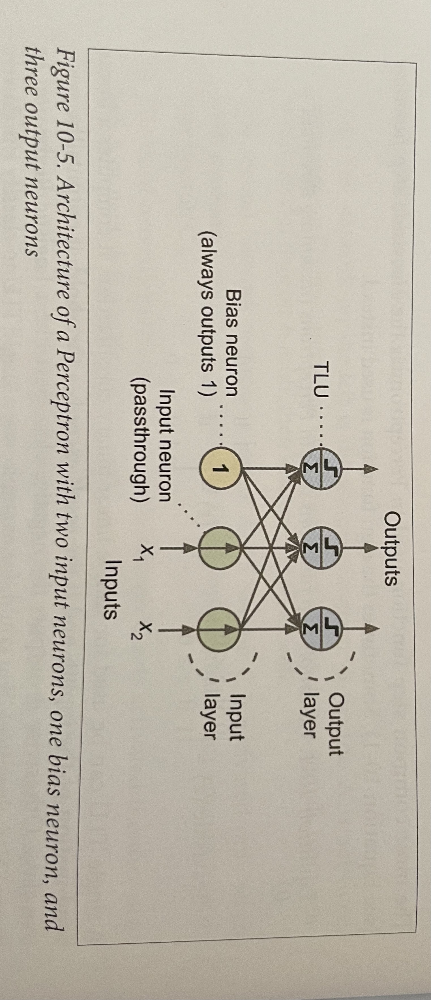

In [2]:
# Exemple de fonctions d'activation

def heaviside(z):
    return np.heaviside(z, 1)

def sgn(z):
    return np.sign(z)

# Schéma perpectron
display(Image(filename='images\perceptron.jpg', width=400))


In [3]:
# Exemple avec scikit learn
import numpy as np
from sklearn.datasets import load_iris
from sklearn.linear_model import Perceptron 

iris = load_iris()
X = iris.data[:, (2, 3)] # longueur et largeur des pétales
y = (iris.target == 0).astype(int) # Iris Setosa?

per_clf = Perceptron()
per_clf.fit(X, y)

y_pred = per_clf.predict([[2, 0.5]])

## MLP (Multi Layer Perceptron) and Backpropagation

- MLP = Input layer + plusieurs couches TLUs (hidden layers) + une couche TLU (output layer)
- Empilement profond de couches : ANN --> DNN

Backpropagation

- en passant deux fois dans le réseau (forward et backward), ajuste les paramètres et les biais en calculant le gradient de l'erreur en regard de chaque paramètre
1) un mini batch à la fois des données, qu'il passe dans le réseau (1 passe = 1 epoch)
2) mini-batch passe dans l'input, qui le passe dans la 1ère hidden layer. L'algo calcule alors l'output de tous les neurones de la couche(pour chaque instance du mini batch). L'output est passée à la prochaine couhe, nouvelle output calculée ainsi de suite jusqu'à la couche finale. --> Forward pass : exactement comme la prédiction mais on garde les valeurs en tête pour la backward pass
3) Mesure de l'écart entre la sortie prédite et la sortie attendue, avec la loss function
4) Calcule comment chaque output contribue à l'erreur (chain rule)
5) Mesure à quel point ces erreurs viennent des connexions dans la couche précédente (chain rule), jusqu'à arriver à l'input layer
6) Enfin, Gradient Descent step qui ajuste les poids en utilisant le gradient calculé

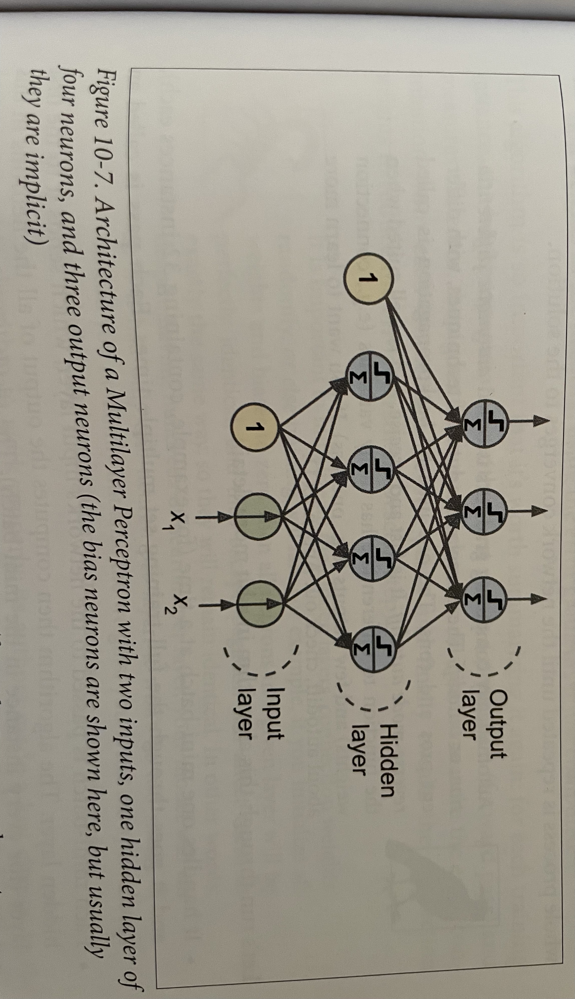

In [4]:
def hyperbolic_tangent(z):
    return np.tanh(z)

def relu(z):
    return np.maximum(0, z)

display(Image(filename='images\mlp.jpg', width=400))

## Regression MLPs

- One output par valeur qu'on veut prédire
- pas utiliser les fonctions d'activation : output any range of values, à la limite RELU ou softplus
- MSE ou MAE (bcp d'outliers) ou le mix : Huber loss

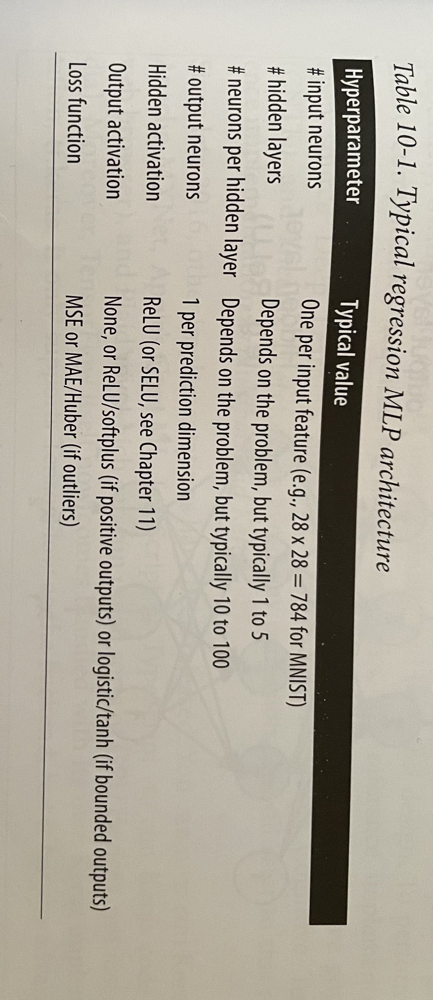

In [5]:
display(Image(filename='images\MLP regression.jpg', width=400))

## Classification MLP

- classification binaire : un output avec fonction logistique en activation (classe négative proba = 1 - valeur de la fonction logistique)
- Multilabel classification (ex : mail savoir si urgent et/ou spam): 2 outputs (1 pour chaque caractéristique) et les outputs somment pas à 1
- classification multiple : 1 neurone d'output par classe (ex : classer des chiffres de 0 à 9), utiliser la fonction softmax sur la dernière couche

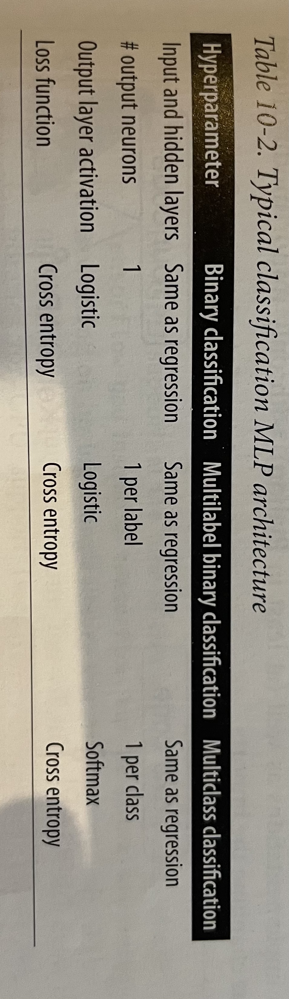

In [6]:
display(Image(filename='images\MLP classification.jpg', width=400))

## Jouer sur le playground de TensorFlow : https://playground.tensorflow.org/

- Les neurones des couches profondes apprennent des schémas plus complexes
- Différence de frontière entre les fonctions d'activation (linéaire / non linéaire)
- risque de local minima pour les small networks
- par contre large networks : pas de local minima (ou alors il est proche du global) et converge rapidement
- DNNs : gradient évanescent, training est plus long, les couches profondes évoluent plus rapidement car le gradient est de plus en plus petit de la droite vers la gauche
- Learning rate élevé : taille des pas lors de l'optimisation des poids du neurone. Si trop grand converge trop rapidement et classification pas assez fine
- Regularisation : évite le surapprentissage en ajoutant une pénalité sur les poids (L1 / L2)

# Implementing MLPs with Keras

- Keras : Deep Learning API
- documentation Keras : https://keras.io/
- Reference implementation of the MLP model : https://github.com/keras-team/keras
- Use, flexibility, beautiful design
- Heavy Implementation : computation backend = TensorFlow (but also CNTK, Theano)
- TensorFlow a son propre implémentation Keras (tf.keras) --> on va utiliser ça

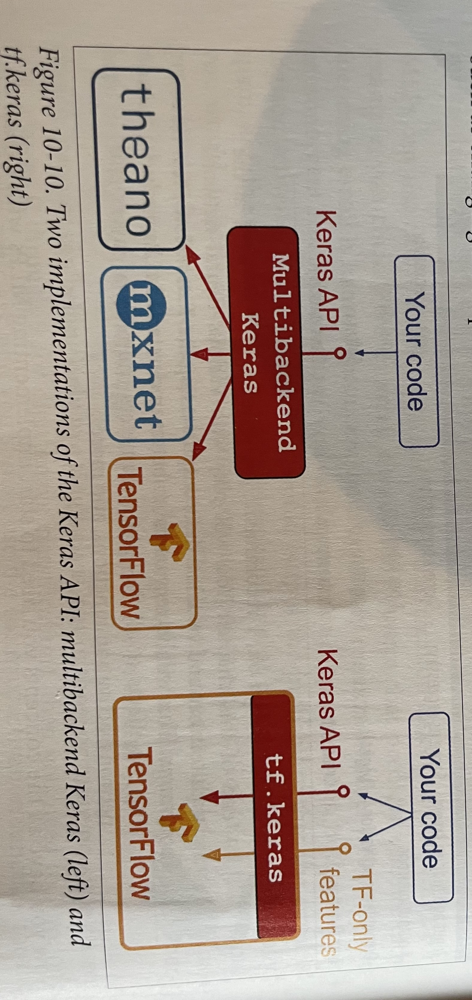

In [7]:
display(Image(filename='images\Keras Backend.jpg', width=400))

## Installation

In [ ]:
#python3 -m pip install --U tensorflow
import tensorflow as tf
from tensorflow import keras
print(tf.__version__)


2.15.0


## Building Image Classifier using Sequential API

In [9]:
# Using keras to load the dataset
fashion_mnist = keras.datasets.fashion_mnist
(X_train_full, y_train_full), (X_test, y_test) = fashion_mnist.load_data() # 60 000 images d'entrainement, 10 000 images de test
print(X_train_full.shape)
print(X_train_full.dtype) # uint8

X_valid, X_train = X_train_full[:5000] / 255.0, X_train_full[5000:] / 255.0 # normalisation (Gradient Descent)
y_valid, y_train = y_train_full[:5000], y_train_full[5000:]
X_test = X_test / 255.0 # normalisation (Gradient Descent)

class_names = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]
print(class_names[y_train[0]]) # Coat

(60000, 28, 28)
uint8
Coat


In [10]:
# Creating the model using the Sequential API

# 1. Define the model
model = keras.models.Sequential()

# 2. Add the layers
# flatten : convert 28x28 array into a 1D array of 784 values, simple preprocessing
model.add(keras.layers.Flatten(input_shape=[28, 28])) # input layer

# Dense : fully connected layer	Dense(300, activation="relu") : 300 neurons, activation function : ReLU
model.add(keras.layers.Dense(300, activation="relu")) # hidden layer
model.add(keras.layers.Dense(100, activation="relu")) # hidden layer

# softmax : output layer, 10 neurons, one per class, each neuron will output the estimated probability that the image belongs to the class
model.add(keras.layers.Dense(10, activation="softmax")) # output layer

#See more activation functions at https://keras.io/activations for the full list

In [11]:
# Instead of adding the layers one by one as we just did, you can pass a list of layers when creating the Sequential model:
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="relu"), 
    keras.layers.Dense(100, activation="relu"),
    keras.layers.Dense(10, activation="softmax")
])

In [12]:
# Model's summary
# display the model's layers, including each layer's name (which is automatically generated unless you set it when creating the layer), its output shape (None means the batch size can be anything), and its number of parameters. The summary ends with the total number of parameters, including trainable and non-trainable parameters.
print(model.summary())

# get_layer() method is useful to retrieve a layer by its name or index.
print(model.layers, model.layers[1].name, model.get_layer('dense_3') is model.layers[1]) 

# All the parameters of a layer can be accessed using its get_weights() and set_weights() methods. 
# For a Dense layer, this includes both the connection weights and the bias terms:
weights, biases = model.layers[1].get_weights()
print(weights, weights.shape)
print(biases, biases.shape)

# See more initializers at https://keras.io/initializers for the full list

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_1 (Flatten)         (None, 784)               0         
                                                                 
 dense_3 (Dense)             (None, 300)               235500    
                                                                 
 dense_4 (Dense)             (None, 100)               30100     
                                                                 
 dense_5 (Dense)             (None, 10)                1010      
                                                                 
Total params: 266610 (1.02 MB)
Trainable params: 266610 (1.02 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
[<keras.src.layers.reshaping.flatten.Flatten object at 0x00000243D664E2C0>, <keras.src.layers.core.dense.Dense object at 0x00000243DC4F18D0>, <ke

Compiling the model
You must compile the model before you can train it. When you compile the model, you specify the loss function and the optimizer to use. Optionally, you can also specify a list of extra metrics to compute during training and evaluation: in this example we specify accuracy as an extra metric.
- loss function : "sparse_categorical_crossentropy" because we have sparse labels (i.e., for each instance, there is just a target class index, from 0 to 9 in this case), and the classes are exclusive.
- optimizer : "sgd" (stochastic gradient descent) optimizer, which will gradually reduce the learning rate during training.
- metrics : "accuracy" metric, which will compute the accuracy score based on the labels (since this is a classification task).

In [13]:
model.compile(loss="sparse_categorical_crossentropy", optimizer="sgd", metrics=["accuracy"])

Epoch 1/30


1719/1719 [==============================] - 11s 6ms/step - loss: 0.7144 - accuracy: 0.7671 - val_loss: 0.5042 - val_accuracy: 0.8286
Epoch 2/30
1719/1719 [==============================] - 10s 6ms/step - loss: 0.4883 - accuracy: 0.8291 - val_loss: 0.4395 - val_accuracy: 0.8534
Epoch 3/30
1719/1719 [==============================] - 10s 6ms/step - loss: 0.4436 - accuracy: 0.8438 - val_loss: 0.4250 - val_accuracy: 0.8536
Epoch 4/30
1719/1719 [==============================] - 10s 6ms/step - loss: 0.4154 - accuracy: 0.8546 - val_loss: 0.4049 - val_accuracy: 0.8600
Epoch 5/30
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3955 - accuracy: 0.8610 - val_loss: 0.3804 - val_accuracy: 0.8674
Epoch 6/30
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3792 - accuracy: 0.8666 - val_loss: 0.3682 - val_accuracy: 0.8734
Epoch 7/30
1719/1719 [==============================] - 10s 6ms/step - loss: 0.3661 - accuracy: 0.8695 - val_loss: 0.3539 - val_

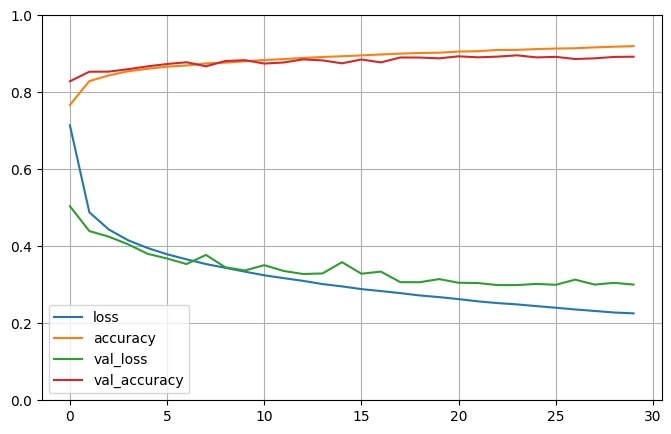

In [14]:
# Training and evaluating the model
history = model.fit(X_train, # features
                    y_train, # labels
                    epochs=30, # number of epochs
                    validation_data=(X_valid, y_valid) # validation set
                    )

# Visualizing the learning curves
import pandas as pd
import matplotlib.pyplot as plt
pd.DataFrame(history.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1) # set the vertical range to [0-1]
plt.show()

In [15]:
model.evaluate(X_test, y_test)

313/313 [==============================] - 2s 5ms/step - loss: 0.3274 - accuracy: 0.8845


[0.3273726999759674, 0.8845000267028809]

In [16]:
X_new = X_test[:3]
y_proba = model.predict(X_new)
print(y_proba.round(2))
predicted_classes = np.argmax(y_proba, axis=1)
print(predicted_classes)
print(np.array(class_names)[predicted_classes])
print(y_test[:3])

1/1 [==============================] - 0s 357ms/step
[[0.   0.   0.   0.   0.   0.   0.   0.01 0.   0.99]
 [0.   0.   0.99 0.   0.01 0.   0.   0.   0.   0.  ]
 [0.   1.   0.   0.   0.   0.   0.   0.   0.   0.  ]]
[9 2 1]
['Ankle boot' 'Pullover' 'Trouser']
[9 2 1]


## Building a regression MLP using the Sequential API

In [17]:
# Building a Regression MLP Using the Sequential API
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Loading the dataset
housing = fetch_california_housing()
X_train_full, X_test, y_train_full, y_test = train_test_split(housing.data, housing.target)
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full)
scaler = StandardScaler() # Standardization
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)
X_test = scaler.transform(X_test)

model = keras.models.Sequential([
    keras.layers.Dense(30, activation="relu", input_shape=X_train.shape[1:]), # input layer
    keras.layers.Dense(1) # output layer
])
model.compile(loss="mean_squared_error", optimizer="sgd")
history = model.fit(X_train, y_train, epochs=20, validation_data=(X_valid, y_valid))
mse_test = model.evaluate(X_test, y_test)
X_new = X_test[:3] # pretend these are new instances
y_pred = model.predict(X_new)
print(y_pred)

Epoch 1/20
363/363 [==============================] - 3s 6ms/step - loss: 0.7678 - val_loss: 0.4608
Epoch 2/20
363/363 [==============================] - 2s 5ms/step - loss: 0.4283 - val_loss: 0.4321
Epoch 3/20
363/363 [==============================] - 1s 4ms/step - loss: 0.3951 - val_loss: 1.2745
Epoch 4/20
363/363 [==============================] - 1s 3ms/step - loss: 0.3881 - val_loss: 0.5850
Epoch 5/20
363/363 [==============================] - 1s 3ms/step - loss: 0.3759 - val_loss: 2.4401
Epoch 6/20
363/363 [==============================] - 1s 4ms/step - loss: 0.3739 - val_loss: 1.6387
Epoch 7/20
363/363 [==============================] - 2s 4ms/step - loss: 0.3680 - val_loss: 1.7556
Epoch 8/20
363/363 [==============================] - 2s 4ms/step - loss: 0.3798 - val_loss: 0.8809
Epoch 9/20
363/363 [==============================] - 2s 4ms/step - loss: 0.3730 - val_loss: 7.3421
Epoch 10/20
363/363 [==============================] - 2s 5ms/step - loss: 0.3680 - val_loss: 5.2596

## Building Complex Models Using the Functional API


- Juste prendre en compte dans l'apprentissage les deux chemins, patterns faciles et compliqués
- Wide and Deep Neural Network https://homl.info/widedeep
- This architecture makes it possible for the neural network to learn both deep patterns (using the deep path) and simple rules (through the short path). In contrast, if you used a regular MLP, the neural network would only learn deep patterns, and if you used a shallow neural network, it would learn just simple rules

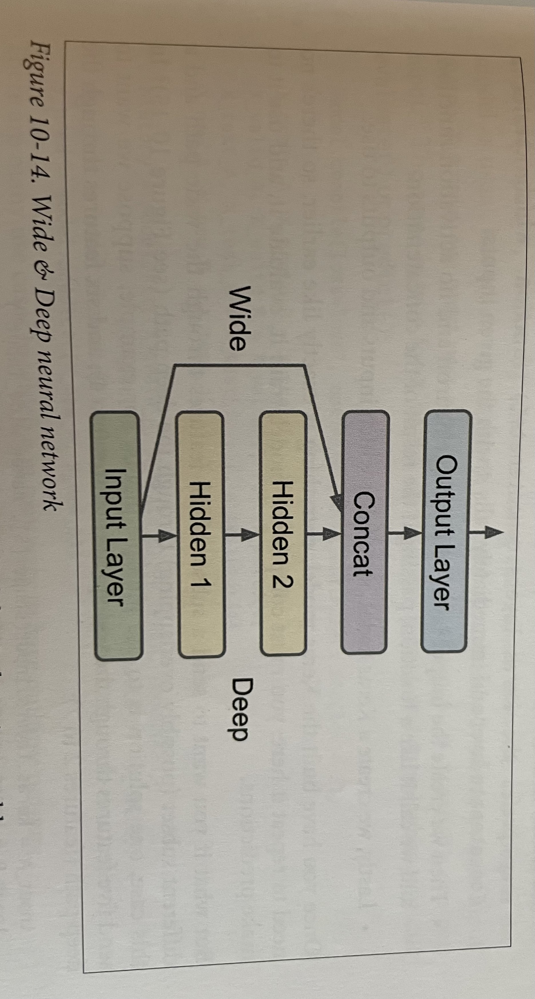

In [18]:
display(Image(filename='images\Wide & Deep.jpg', width=400))

In [19]:
input_ = keras.layers.Input(shape=X_train.shape[1:]) # specify the inputs
hidden1 = keras.layers.Dense(30, activation="relu")(input_) # As soon as it is created, you call it like a function, passing it the input. This is why this is called the Functional API. We are just telling Keras how it should connect the layers together, and it will take care of actually connecting them.
hidden2 = keras.layers.Dense(30, activation="relu")(hidden1)
concat = keras.layers.Concatenate()([input_, hidden2]) # concatenate the input and the output of the second hidden layer
output = keras.layers.Dense(1)(concat) # create the output layer
model = keras.Model(inputs=[input_], outputs=[output]) # create the model, specifying which inputs and outputs to use

But what if you want to send a subset of the features through the wide path and a different subset (possibly overlapping) through the deep path In this case, one solution is to use multiple inputs. For example, suppose we want to send five features through the deep path (features 0 to 4), and six features through the wide path (features 2 to 7):

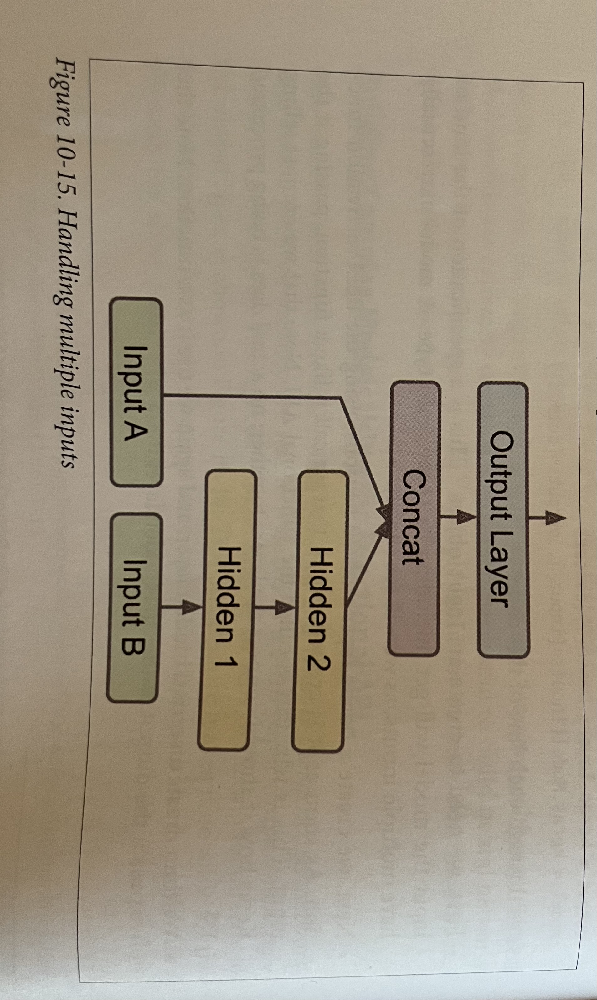

In [20]:
display(Image(filename='images\Wide & Deep 2.jpg', width=400))

In [21]:
input_A = keras.layers.Input(shape=[5], name="wide_input") # wide path
input_B = keras.layers.Input(shape=[6], name="deep_input") # deep path
hidden1 = keras.layers.Dense(30, activation="relu")(input_B) # deep path
hidden2 = keras.layers.Dense(30, activation="relu")(hidden1) # deep path
concat = keras.layers.concatenate([input_A, hidden2]) # concatenate the inputs
output = keras.layers.Dense(1, name="output")(concat) # output layer
model = keras.Model(inputs=[input_A, input_B], outputs=[output]) # create the model, specifying which inputs and outputs to use
model.compile(loss="mse", optimizer=keras.optimizers.SGD(lr=1e-3))
X_train_A, X_train_B = X_train[:, :5], X_train[:, 2:] # split the training set into two subsets, one with the first 5 features (the wide input), and the other with the 6th to 8th feature (the deep input)
X_valid_A, X_valid_B = X_valid[:, :5], X_valid[:, 2:] # split the validation set likewise
X_test_A, X_test_B = X_test[:, :5], X_test[:, 2:] # split the test set likewise
X_new_A, X_new_B = X_test_A[:3], X_test_B[:3] # pretend these are new instances
history = model.fit((X_train_A, X_train_B), y_train, epochs=20, validation_data=((X_valid_A, X_valid_B), y_valid))
mse_test = model.evaluate((X_test_A, X_test_B), y_test)
y_pred = model.predict((X_new_A, X_new_B))

Epoch 1/20
363/363 [==============================] - 4s 6ms/step - loss: 0.7300 - val_loss: 1.2276
Epoch 2/20
363/363 [==============================] - 2s 5ms/step - loss: 0.4472 - val_loss: 0.7300
Epoch 3/20
363/363 [==============================] - 2s 5ms/step - loss: 0.4185 - val_loss: 0.8101
Epoch 4/20
363/363 [==============================] - 2s 4ms/step - loss: 0.4108 - val_loss: 0.7779
Epoch 5/20
363/363 [==============================] - 1s 4ms/step - loss: 0.4076 - val_loss: 2.5690
Epoch 6/20
363/363 [==============================] - 1s 4ms/step - loss: 0.3988 - val_loss: 0.4927
Epoch 7/20
363/363 [==============================] - 1s 4ms/step - loss: 0.3902 - val_loss: 2.4351
Epoch 8/20
363/363 [==============================] - 1s 3ms/step - loss: 0.3962 - val_loss: 0.9143
Epoch 9/20
363/363 [==============================] - 2s 5ms/step - loss: 0.3804 - val_loss: 1.3487
Epoch 10/20
363/363 [==============================] - 2s 5ms/step - loss: 0.3799 - val_loss: 0.3968

Plusieurs cas où on veut avoir plusieurs outputs:
- La tache le requiert : recherche le centre d'un objet (calculer ses deux coordonnées) et le classifier
- Multiples tâches sur les mêmes données : on pourrait se dire de faire un réseau par tâches. Mais en général on a de meilleurs résultats en entraînant un réseau sur plusieurs tâches, car il apprend les features qui sont utiles aux tâches. Ex : classifier à la fois l'expression d'un visage et s'il porte des lunettes ou non
- Cas de la régularisation : (contrainte d'entraînement pour éviter l'overfitting). Ajouter quelques sorties auxiliaires dans une architecture de réseau neuronal pour garantir que la partie sous-jacente du réseau apprend quelque chose d'utile par elle-même, sans dépendre du reste du réseau.

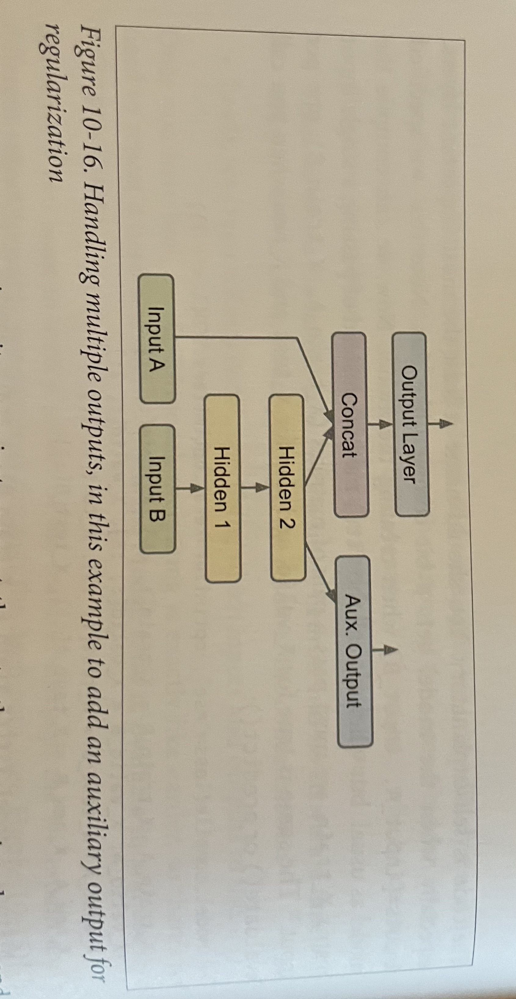

In [22]:
# Handling Multiple Outputs to add an auxiliary output for regularization purposes
display(Image(filename='images\Regularisation Multiple Output.jpg', width=400))

In [23]:
#Same model as before, but with an extra output
output = keras.layers.Dense(1, name="main_output")(concat) # output layer
aux_output = keras.layers.Dense(1, name="aux_output")(hidden2) # auxiliary output
model = keras.Model(inputs=[input_A, input_B], outputs=[output, aux_output])

Each output will need its own loss function. Therefore, when we compile the model, we should pass a list of losses (if we pass a single loss, Keras will assume that the same loss must be used for all outputs). By default, Keras will compute all these losses and simply add them up to get the final loss used for training. We care much more about the main output than about the auxiliary output (as it is just used for regularization), so we want to give the main output's loss a much greater weight. Fortunately, it is possible to set all the loss weights when compiling the model:

In [24]:
model.compile(loss=["mse", "mse"], loss_weights=[0.9, 0.1], optimizer="sgd") # 0.9 and 0.1 are the loss weights

Now when we train the model, we need to provide labels for each output. In this example, the main output and the auxiliary output should try to predict the same thing, so they should use the same labels. So instead of passing y_train, we need to pass (y_train, y_train) (and the same goes for y_valid and y_test):

In [25]:
history = model.fit([X_train_A, X_train_B], [y_train, y_train], epochs=20, validation_data=([X_valid_A, X_valid_B], [y_valid, y_valid]))
total_loss, main_loss, aux_loss = model.evaluate([X_test_A, X_test_B], [y_test, y_test])
y_pred_main, y_pred_aux = model.predict([X_new_A, X_new_B])

Epoch 1/20
363/363 [==============================] - 4s 7ms/step - loss: 0.6654 - main_output_loss: 0.5678 - aux_output_loss: 1.5434 - val_loss: 1.3817 - val_main_output_loss: 0.4457 - val_aux_output_loss: 9.8053
Epoch 2/20
363/363 [==============================] - 2s 5ms/step - loss: 0.4213 - main_output_loss: 0.3762 - aux_output_loss: 0.8271 - val_loss: 1.8531 - val_main_output_loss: 1.3933 - val_aux_output_loss: 5.9910
Epoch 3/20
363/363 [==============================] - 1s 4ms/step - loss: 0.3987 - main_output_loss: 0.3711 - aux_output_loss: 0.6475 - val_loss: 0.7368 - val_main_output_loss: 0.5723 - val_aux_output_loss: 2.2172
Epoch 4/20
363/363 [==============================] - 1s 4ms/step - loss: 0.3820 - main_output_loss: 0.3621 - aux_output_loss: 0.5617 - val_loss: 0.6753 - val_main_output_loss: 0.5145 - val_aux_output_loss: 2.1228
Epoch 5/20
363/363 [==============================] - 2s 5ms/step - loss: 0.3727 - main_output_loss: 0.3567 - aux_output_loss: 0.5163 - val_loss

## Using the Subclassing API to Build Dynamic Models

- Subclassing API is used to build dynamic models.
- Both Sequential API and Functional API are declarative.
- Declarative models offer advantages such as easy saving, cloning, and sharing.
- Declarative models allow structure display, analysis, and early error checking.
- Static graph of layers in declarative models facilitates debugging.

Limitations of Declarative Models:
- Declarative models are static, not suitable for dynamic behaviors.
- Some models require loops, varying shapes, and conditional branching.
- If you prefer an imperative programming style, Subclassing API is suitable.

Advantages of Subclassing API:
- Subclassing API is more flexible for dynamic models.
- Well-suited for cases involving loops, varying shapes, and dynamic behaviors.
- Allows a more imperative programming style.

Considerations for Subclassing API Usage:
- Use Subclassing API when dynamic model behaviors are needed.
- Provides flexibility but may require additional attention to detail.
- A choice for those who prefer imperative programming or have specific dynamic model requirements.

In [26]:
# Using the Subclassing API to build Dynamic Models
# Both the Sequential API and the Functional API are declarative: you start by declaring which layers you want to use and how they should be connected, and only then can you start feeding the model some data for training or inference. This has many advantages: the model can easily be saved, cloned, and shared; its structure can be displayed and analyzed; the framework can infer shapes and check types, so errors can be caught early (i.e., before any data ever goes through the model). It’s also fairly easy to debug, since the whole model is a static graph of layers. But the flip side is just that: it’s static. Some models involve loops, varying shapes, conditional branching, and other dynamic behaviors. For such cases, or simply if you prefer a more imperative programming style, the Subclassing API is for you.

class WideAndDeepModel(keras.Model):
    def __init__(self, units=30, activation="relu", **kwargs): 
        super().__init__(**kwargs) # handles standard arguments (e.g., name)
        self.hidden1 = keras.layers.Dense(units, activation=activation)
        self.hidden2 = keras.layers.Dense(units, activation=activation)
        self.main_output = keras.layers.Dense(1)
        self.aux_output = keras.layers.Dense(1)
    def call(self, inputs): # handles the actual logic
        input_A, input_B = inputs
        hidden1 = self.hidden1(input_B)
        hidden2 = self.hidden2(hidden1)
        concat = keras.layers.concatenate([input_A, hidden2])
        main_output = self.main_output(concat)
        aux_output = self.aux_output(hidden2)
        return main_output, aux_output
    
model = WideAndDeepModel()

#You can do pretty much anything you want in the call() method: for loops, if statements, low-level TensorFlow operations—your imagination is the limit. This makes it a great API for researchers experimenting with new ideas.

## Save and restoring your model

In [27]:
# Pas run, juste pour montrer la syntaxe
model = keras.models.Sequential([...])
model.compile(...)
model.fit(...)
model.save("my_keras_model.h5") # save the model

TypeError: The added layer must be an instance of class Layer. Received: layer=Ellipsis of type <class 'ellipsis'>.

In [ ]:
# Load a model
model = keras.models.load_model("my_keras_model.h5") # load the model

## Using callbacks

But what if training lasts several hours? This is quite common, especially when training on large datasets. In this case, you should not only save your model at the end of training, but also save checkpoints at regular intervals during training, to avoid losing everything if your computer crashes. But how can you tell the fit() method to save checkpoints? Use callbacks.

In [ ]:
# 1. Load the dataset
fashion_mnist = keras.datasets.fashion_mnist
(X_train_full, y_train_full), (X_test, y_test) = fashion_mnist.load_data() # 60 000 images d'entrainement, 10 000 images de test
print(X_train_full.shape)
print(X_train_full.dtype) # uint8

X_valid, X_train = X_train_full[:5000] / 255.0, X_train_full[5000:] / 255.0 # normalisation (Gradient Descent)
y_valid, y_train = y_train_full[:5000], y_train_full[5000:]
X_test = X_test / 255.0 # normalisation (Gradient Descent)

class_names = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]
print(class_names[y_train[0]]) # Coat

# 2. Create the model using the Sequential API
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="relu"), 
    keras.layers.Dense(100, activation="relu"),
    keras.layers.Dense(10, activation="softmax")
])

# 3. Compile the model
model.compile(loss="sparse_categorical_crossentropy", 
              optimizer="sgd", 
              metrics=["accuracy"])

# 4. Train the model and save it at the end of each epoch and keep only the best one, and combine it with early stopping
checkpoint_cb = keras.callbacks.ModelCheckpoint("my_keras_model.h5", 
                                                 save_best_only=True) # save only the best model
early_stopping_cb = keras.callbacks.EarlyStopping(patience=10, 
                                                  restore_best_weights=True)
history = model.fit(X_train,
                    y_train, 
                    epochs=100, 
                    validation_data=(X_valid, y_valid), 
                    callbacks=[checkpoint_cb, early_stopping_cb]) # train the model, saving it at each epoch

model = keras.models.load_model("my_keras_model.h5") # roll back to the best model


(60000, 28, 28)
uint8
Coat
Epoch 1/100
1719/1719 [==============================] - 3s 2ms/step - loss: 0.7198 - accuracy: 0.7617 - val_loss: 0.5400 - val_accuracy: 0.8152
Epoch 2/100
  37/1719 [..............................] - ETA: 4s - loss: 0.5555 - accuracy: 0.7973

c:\ProgramData\Anaconda3\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1719/1719 [==============================] - 3s 2ms/step - loss: 0.4903 - accuracy: 0.8280 - val_loss: 0.4423 - val_accuracy: 0.8490
Epoch 3/100
1719/1719 [==============================] - 3s 1ms/step - loss: 0.4466 - accuracy: 0.8440 - val_loss: 0.4187 - val_accuracy: 0.8568
Epoch 4/100
1719/1719 [==============================] - 3s 2ms/step - loss: 0.4187 - accuracy: 0.8551 - val_loss: 0.4054 - val_accuracy: 0.8560
Epoch 5/100
1719/1719 [==============================] - 3s 2ms/step - loss: 0.3980 - accuracy: 0.8609 - val_loss: 0.3881 - val_accuracy: 0.8628
Epoch 6/100
1719/1719 [==============================] - 3s 1ms/step - loss: 0.3831 - accuracy: 0.8652 - val_loss: 0.3701 - val_accuracy: 0.8718
Epoch 7/100
1719/1719 [==============================] - 3s 2ms/step - loss: 0.3685 - accuracy: 0.8693 - val_loss: 0.3679 - val_accuracy: 0.8708
Epoch 8/100
1719/1719 [==============================] - 3s 2ms/step - loss: 0.3560 - accuracy: 0.8732 - val_loss: 0.3693 - val_accuracy: 0.87

## Using TensorBoard for Visualization

TensorBoard = great interactive viz tool (learning curves, computational graph, analyzing training stats, viewing images generated by your model, visualizing complex multidimensional data projected down to 3D and automatically clustered for you, and more!)

In [ ]:
# Using TensorBoard for Visualization
import os
root_logdir = os.path.join(os.curdir, "my_logs")

def get_run_logdir(): # function to generate a subdirectory path for each run
    import time
    run_id = time.strftime("run_%Y_%m_%d-%H_%M_%S")
    return os.path.join(root_logdir, run_id)

run_logdir = get_run_logdir() # e.g., './my_logs/run_2019_06_07-15_15_22'

# 1. Load the dataset
fashion_mnist = keras.datasets.fashion_mnist
(X_train_full, y_train_full), (X_test, y_test) = fashion_mnist.load_data() # 60 000 images d'entrainement, 10 000 images de test
print(X_train_full.shape)
print(X_train_full.dtype) # uint8

X_valid, X_train = X_train_full[:5000] / 255.0, X_train_full[5000:] / 255.0 # normalisation (Gradient Descent)
y_valid, y_train = y_train_full[:5000], y_train_full[5000:]
X_test = X_test / 255.0 # normalisation (Gradient Descent)

class_names = ["T-shirt/top", "Trouser", "Pullover", "Dress", "Coat", "Sandal", "Shirt", "Sneaker", "Bag", "Ankle boot"]
print(class_names[y_train[0]]) # Coat

# 2. Create the model using the Sequential API
model = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(300, activation="relu"), 
    keras.layers.Dense(100, activation="relu"),
    keras.layers.Dense(10, activation="softmax")
])

# 3. Compile the model
model.compile(loss="sparse_categorical_crossentropy", 
              optimizer="sgd", 
              metrics=["accuracy"])

tensorboard_cb = keras.callbacks.TensorBoard(run_logdir) # create a TensorBoard callback
history = model.fit(X_train, 
                    y_train, 
                    epochs=30, 
                    validation_data=(X_valid, y_valid), 
                    callbacks=[tensorboard_cb]) # train the model, saving it at each epoch

# tensorboard --logdir=./my_logs --port=6006 # run TensorBoard server
# http://localhost:6006 là où on peut voir les résultats

(60000, 28, 28)
uint8
Coat
Epoch 1/30
1719/1719 [==============================] - 3s 2ms/step - loss: 0.7265 - accuracy: 0.7630 - val_loss: 0.5579 - val_accuracy: 0.7998
Epoch 2/30
1719/1719 [==============================] - 3s 2ms/step - loss: 0.4919 - accuracy: 0.8301 - val_loss: 0.4533 - val_accuracy: 0.8482
Epoch 3/30
1719/1719 [==============================] - 3s 2ms/step - loss: 0.4453 - accuracy: 0.8437 - val_loss: 0.4149 - val_accuracy: 0.8592
Epoch 4/30
1719/1719 [==============================] - 3s 2ms/step - loss: 0.4168 - accuracy: 0.8537 - val_loss: 0.4063 - val_accuracy: 0.8618
Epoch 5/30
1719/1719 [==============================] - 3s 2ms/step - loss: 0.3963 - accuracy: 0.8613 - val_loss: 0.3938 - val_accuracy: 0.8652
Epoch 6/30
1719/1719 [==============================] - 3s 2ms/step - loss: 0.3816 - accuracy: 0.8663 - val_loss: 0.3871 - val_accuracy: 0.8684
Epoch 7/30
1719/1719 [==============================] - 3s 2ms/step - loss: 0.3674 - accuracy: 0.8701 - val_l

##

So far :
- D'où viennent les ANNs
- Ce qu'est un MLP
- Utilisation pour la classification et la régression
- Sequential API pour les cas simples, Functionnal API et Subclassing API pour les cas plus complexes
- Enregistrer et restaurer un modèle de réseau, en combinant à la fois les checkpoints (si l'ordi crash) et les early stoppings (éviter de continuer dans les epochs si on a déjà atteint le min)
- Visualiser avec le TensorBoard()

# Fine-tuner les hyperparamètres d'un réseau de neurones

ANNs flexibles mais nécessite un hyperparamétrage lourd \
On peut imaginer déjà n'importe quel type de structure, mais déjà avec un MLP il y a à gérer :
- Le nombre de couches
- Le nombre de neurones par couche
- Les fonctions d'activation
- L'initialisation des poids
- Learning rate
- Optimizer
- Batch size
- Nombre d'itérations
... \

Comment savoir quelle combinaison utiliser ?

1ère approche : on explore avec GridSearch et RandomizedSearch

In [ ]:
# We need to wrap our Keras models in objects that mimic regular Scikit-Learn regressors. The first step is to create a function that will build and compile a Keras model, given a set of hyperparameters:
def build_model(n_hidden=1, n_neurons=30, learning_rate=3e-3, input_shape=[8]):
    model = keras.models.Sequential()  # create the model
    model.add(keras.layers.InputLayer(input_shape=input_shape))
    for layer in range(n_hidden):  # add the hidden layers
        model.add(keras.layers.Dense(n_neurons, activation="relu"))
    model.add(keras.layers.Dense(1))  # add the output layer
    optimizer = keras.optimizers.SGD(learning_rate=learning_rate)
    model.compile(loss="mse", optimizer=optimizer)
    return model


# Loading the dataset
from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import tensorflow, scikeras

housing = fetch_california_housing()
X_train_full, X_test, y_train_full, y_test = train_test_split(
    housing.data, housing.target
)
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full)
scaler = StandardScaler()  # Standardization
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)
X_test = scaler.transform(X_test)

# Creating a KerasRegressor based on the build_model() function
keras_reg = scikeras.wrappers.KerasRegressor(build_model)

keras_reg.fit(
    X_train,
    y_train,
    epochs=100,
    validation_data=(X_valid, y_valid),
    callbacks=[keras.callbacks.EarlyStopping(patience=10)],
) # Any extra parameter you pass to the fit() method will get passed to the underlying Keras model

mse_test = keras_reg.score(X_test, y_test) #Note that the score will be the opposite of the MSE because  Scikit-Learn wants scores, not losses (i.e., higher should be better).
y_pred = keras_reg.predict(X_new)
print(mse_test, y_pred)

Epoch 1/100
363/363 [==============================] - 1s 1ms/step - loss: 1.4293 - val_loss: 0.9706
Epoch 2/100
363/363 [==============================] - 0s 1ms/step - loss: 0.8871 - val_loss: 0.6433
Epoch 3/100
363/363 [==============================] - 0s 1ms/step - loss: 0.6195 - val_loss: 0.5866
Epoch 4/100
363/363 [==============================] - 0s 1ms/step - loss: 0.5817 - val_loss: 0.5471
Epoch 5/100
363/363 [==============================] - 0s 1ms/step - loss: 0.5421 - val_loss: 0.5225
Epoch 6/100
363/363 [==============================] - 0s 1ms/step - loss: 0.5167 - val_loss: 0.5040
Epoch 7/100
363/363 [==============================] - 0s 1ms/step - loss: 0.5051 - val_loss: 0.4880
Epoch 8/100
363/363 [==============================] - 0s 1ms/step - loss: 0.4944 - val_loss: 0.4734
Epoch 9/100
363/363 [==============================] - 0s 1ms/step - loss: 0.4782 - val_loss: 0.4656
Epoch 10/100
363/363 [==============================] - 0s 1ms/step - loss: 0.4659 - val_lo

In [ ]:
# Hyperparameter Tuning
from scipy.stats import reciprocal
from sklearn.model_selection import RandomizedSearchCV

def build_model(n_hidden=1, 
                n_neurons=30, 
                learning_rate=3e-3, 
                input_shape=[8]):
    model = keras.models.Sequential()  # create the model
    model.add(keras.layers.InputLayer(input_shape=input_shape))
    for layer in range(n_hidden):  # add the hidden layers
        model.add(keras.layers.Dense(n_neurons, activation="relu"))
    model.add(keras.layers.Dense(1))  # add the output layer
    optimizer = keras.optimizers.SGD(learning_rate=learning_rate
                                     )
    model.compile(loss="mse", optimizer=optimizer)
    return model

# Creating a KerasRegressor based on the build_model() function
keras_reg = scikeras.wrappers.KerasRegressor(build_model, 
                                             learning_rate=0.0030305675522238847,
                                             n_hidden=1,
                                             n_neurons=30)

param_distribs = {
    "n_hidden": [0, 1, 2, 3],
    "n_neurons": np.arange(1, 100),
    "learning_rate": reciprocal(3e-4, 3e-2),
}

rnd_search_cv = RandomizedSearchCV(
    keras_reg, param_distributions=param_distribs, n_iter=10, cv=3) # create a RandomizedSearchCV object, passing it the KerasRegressor, the param_distribs dictionary, the number of iterations, the number of cross-validation folds, and the verbosity level
rnd_search_cv.fit(
    X_train,
    y_train,
    epochs=100,
    validation_data=(X_valid, y_valid),
    callbacks=[keras.callbacks.EarlyStopping(patience=10)],
) # train it like a regular Scikit-Learn estimator

Epoch 1/100
242/242 [==============================] - 0s 1ms/step - loss: 2.4079 - val_loss: 0.9614
Epoch 2/100
242/242 [==============================] - 0s 1ms/step - loss: 0.8078 - val_loss: 0.7707
Epoch 3/100
242/242 [==============================] - 0s 1ms/step - loss: 0.7158 - val_loss: 0.7083
Epoch 4/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6666 - val_loss: 0.6592
Epoch 5/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6311 - val_loss: 0.6236
Epoch 6/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6056 - val_loss: 0.5953
Epoch 7/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5861 - val_loss: 0.5741
Epoch 8/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5716 - val_loss: 0.5584
Epoch 9/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5608 - val_loss: 0.5477
Epoch 10/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5530 - val_lo

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1117, in score
    return self.scorer(y, y_pred, sample_weight=sample_weight, **score_args)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1714, in scorer
    return sklearn_r2_score(y_true, y_pred, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 911, in r2_score
    y_type, y_tru

242/242 [==============================] - 1s 1ms/step - loss: 0.9350 - val_loss: 2.5795
Epoch 2/100
242/242 [==============================] - 0s 1ms/step - loss: nan - val_loss: nan
Epoch 3/100
242/242 [==============================] - 0s 1ms/step - loss: nan - val_loss: nan
Epoch 4/100
242/242 [==============================] - 0s 1ms/step - loss: nan - val_loss: nan
Epoch 5/100
242/242 [==============================] - 0s 1ms/step - loss: nan - val_loss: nan
Epoch 6/100
242/242 [==============================] - 0s 1ms/step - loss: nan - val_loss: nan
Epoch 7/100
242/242 [==============================] - 0s 1ms/step - loss: nan - val_loss: nan
Epoch 8/100
242/242 [==============================] - 0s 1ms/step - loss: nan - val_loss: nan
Epoch 9/100
242/242 [==============================] - 0s 1ms/step - loss: nan - val_loss: nan
Epoch 10/100
242/242 [==============================] - 0s 1ms/step - loss: nan - val_loss: nan
Epoch 11/100
242/242 [==============================] -

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1117, in score
    return self.scorer(y, y_pred, sample_weight=sample_weight, **score_args)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1714, in scorer
    return sklearn_r2_score(y_true, y_pred, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 911, in r2_score
    y_type, y_tru

242/242 [==============================] - 1s 2ms/step - loss: 3.0168 - val_loss: 1.3305
Epoch 2/100
242/242 [==============================] - 0s 1ms/step - loss: 1.1280 - val_loss: 0.9146
Epoch 3/100
242/242 [==============================] - 0s 1ms/step - loss: 0.8519 - val_loss: 0.8070
Epoch 4/100
242/242 [==============================] - 0s 1ms/step - loss: 0.7669 - val_loss: 0.7546
Epoch 5/100
242/242 [==============================] - 0s 1ms/step - loss: 0.7251 - val_loss: 0.7180
Epoch 6/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6991 - val_loss: 0.6945
Epoch 7/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6783 - val_loss: 0.6743
Epoch 8/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6603 - val_loss: 0.6533
Epoch 9/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6441 - val_loss: 0.6370
Epoch 10/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6291 - val_loss: 0.6205
E

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1117, in score
    return self.scorer(y, y_pred, sample_weight=sample_weight, **score_args)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1714, in scorer
    return sklearn_r2_score(y_true, y_pred, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 911, in r2_score
    y_type, y_tru

242/242 [==============================] - 0s 1ms/step - loss: 1.3200 - val_loss: 13.7949
Epoch 2/100
242/242 [==============================] - 0s 1ms/step - loss: 45.2067 - val_loss: 2100.3206
Epoch 3/100
242/242 [==============================] - 0s 1000us/step - loss: 11603.5273 - val_loss: 319413.9062
Epoch 4/100
242/242 [==============================] - 0s 1ms/step - loss: 2099604.0000 - val_loss: 48705816.0000
Epoch 5/100
242/242 [==============================] - 0s 1ms/step - loss: 180167264.0000 - val_loss: 7416083456.0000
Epoch 6/100
242/242 [==============================] - 0s 1ms/step - loss: 39926243328.0000 - val_loss: 1130342514688.0000
Epoch 7/100
242/242 [==============================] - 0s 1ms/step - loss: 4553847078912.0000 - val_loss: 172192721534976.0000
Epoch 8/100
242/242 [==============================] - 0s 1ms/step - loss: 952590795800576.0000 - val_loss: 26250737033936896.0000
Epoch 9/100
242/242 [==============================] - 0s 1ms/step - loss: 9803

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1117, in score
    return self.scorer(y, y_pred, sample_weight=sample_weight, **score_args)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1714, in scorer
    return sklearn_r2_score(y_true, y_pred, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 911, in r2_score
    y_type, y_tru

242/242 [==============================] - 0s 1ms/step - loss: 0.9817 - val_loss: 0.6842
Epoch 2/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6918 - val_loss: 0.5439
Epoch 3/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5974 - val_loss: 0.5289
Epoch 4/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5516 - val_loss: 0.5293
Epoch 5/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5631 - val_loss: 0.5897
Epoch 6/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6243 - val_loss: 0.5838
Epoch 7/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5253 - val_loss: 0.6734
Epoch 8/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6037 - val_loss: 0.6700
Epoch 9/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5581 - val_loss: 0.7181
Epoch 10/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5304 - val_loss: 1.4181
E

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1117, in score
    return self.scorer(y, y_pred, sample_weight=sample_weight, **score_args)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1714, in scorer
    return sklearn_r2_score(y_true, y_pred, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 911, in r2_score
    y_type, y_tru

242/242 [==============================] - 0s 1ms/step - loss: 1.0245 - val_loss: 1.4966
Epoch 2/100
242/242 [==============================] - 0s 1ms/step - loss: 4.2516 - val_loss: 133.0030
Epoch 3/100
242/242 [==============================] - 0s 1ms/step - loss: 569.8066 - val_loss: 17614.1934
Epoch 4/100
242/242 [==============================] - 0s 1ms/step - loss: 101791.9141 - val_loss: 2353091.7500
Epoch 5/100
242/242 [==============================] - 0s 1ms/step - loss: 6796731.0000 - val_loss: 318716000.0000
Epoch 6/100
242/242 [==============================] - 0s 1ms/step - loss: 899899712.0000 - val_loss: 42709688320.0000
Epoch 7/100
242/242 [==============================] - 0s 1ms/step - loss: 208830152704.0000 - val_loss: 5689530908672.0000
Epoch 8/100
242/242 [==============================] - 0s 1ms/step - loss: 16672569163776.0000 - val_loss: 766098483970048.0000
Epoch 9/100
242/242 [==============================] - 0s 1ms/step - loss: 2198594295693312.0000 - val_

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1117, in score
    return self.scorer(y, y_pred, sample_weight=sample_weight, **score_args)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1714, in scorer
    return sklearn_r2_score(y_true, y_pred, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 911, in r2_score
    y_type, y_tru

242/242 [==============================] - 0s 1ms/step - loss: 0.9073 - val_loss: 0.7787
Epoch 2/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5573 - val_loss: 0.6503
Epoch 3/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5240 - val_loss: 0.5640
Epoch 4/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5135 - val_loss: 0.5101
Epoch 5/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5028 - val_loss: 0.4876
Epoch 6/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5605 - val_loss: 0.5277
Epoch 7/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5144 - val_loss: 0.4941
Epoch 8/100
242/242 [==============================] - 0s 1ms/step - loss: 0.4951 - val_loss: 0.4831
Epoch 9/100
242/242 [==============================] - 0s 1ms/step - loss: 0.4863 - val_loss: 0.4791
Epoch 10/100
242/242 [==============================] - 0s 1ms/step - loss: 0.4956 - val_loss: 0.4846
E

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1117, in score
    return self.scorer(y, y_pred, sample_weight=sample_weight, **score_args)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1714, in scorer
    return sklearn_r2_score(y_true, y_pred, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 911, in r2_score
    y_type, y_tru

242/242 [==============================] - 0s 1ms/step - loss: 1.2597 - val_loss: 0.7284
Epoch 2/100
242/242 [==============================] - 0s 1ms/step - loss: 0.6556 - val_loss: 0.6064
Epoch 3/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5730 - val_loss: 0.5540
Epoch 4/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5285 - val_loss: 0.5174
Epoch 5/100
242/242 [==============================] - 0s 1ms/step - loss: 0.5036 - val_loss: 0.5070
Epoch 6/100
242/242 [==============================] - 0s 1ms/step - loss: 0.4856 - val_loss: 0.4986
Epoch 7/100
242/242 [==============================] - 0s 1ms/step - loss: 0.4734 - val_loss: 0.4948
Epoch 8/100
242/242 [==============================] - 0s 1ms/step - loss: 0.4653 - val_loss: 0.4932
Epoch 9/100
242/242 [==============================] - 0s 1ms/step - loss: 0.4578 - val_loss: 0.4872
Epoch 10/100
242/242 [==============================] - 0s 1ms/step - loss: 0.4516 - val_loss: 0.4845
E

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1117, in score
    return self.scorer(y, y_pred, sample_weight=sample_weight, **score_args)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1714, in scorer
    return sklearn_r2_score(y_true, y_pred, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 911, in r2_score
    y_type, y_tru

242/242 [==============================] - 1s 4ms/step - loss: 1.3510 - val_loss: 16.6694
Epoch 2/100
242/242 [==============================] - 0s 2ms/step - loss: 44.5013 - val_loss: 3031.2441
Epoch 3/100
242/242 [==============================] - 0s 1ms/step - loss: 9071.2051 - val_loss: 521860.1875
Epoch 4/100
242/242 [==============================] - 0s 1ms/step - loss: 3603642.7500 - val_loss: 91109928.0000
Epoch 5/100
242/242 [==============================] - 0s 1ms/step - loss: 335967264.0000 - val_loss: 15901602816.0000
Epoch 6/100
242/242 [==============================] - 0s 1ms/step - loss: 65840869376.0000 - val_loss: 2780702703616.0000
Epoch 7/100
242/242 [==============================] - 0s 1ms/step - loss: 7516280848384.0000 - val_loss: 492251604058112.0000
Epoch 8/100
242/242 [==============================] - 0s 1ms/step - loss: 1875988430454784.0000 - val_loss: 85061595369046016.0000
Epoch 9/100
242/242 [==============================] - 0s 1ms/step - loss: 488566

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1117, in score
    return self.scorer(y, y_pred, sample_weight=sample_weight, **score_args)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1714, in scorer
    return sklearn_r2_score(y_true, y_pred, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 911, in r2_score
    y_type, y_tru

242/242 [==============================] - 1s 2ms/step - loss: 0.6690 - val_loss: 0.4978
Epoch 2/100
242/242 [==============================] - 0s 2ms/step - loss: 0.4749 - val_loss: 0.4497
Epoch 3/100
242/242 [==============================] - 0s 2ms/step - loss: 0.4716 - val_loss: 0.4888
Epoch 4/100
242/242 [==============================] - 0s 2ms/step - loss: 0.4454 - val_loss: 0.4223
Epoch 5/100
242/242 [==============================] - 0s 2ms/step - loss: 0.4127 - val_loss: 0.4219
Epoch 6/100
242/242 [==============================] - 0s 2ms/step - loss: 0.4038 - val_loss: 0.4294
Epoch 7/100
242/242 [==============================] - 0s 2ms/step - loss: 0.3930 - val_loss: 0.3915
Epoch 8/100
242/242 [==============================] - 0s 2ms/step - loss: 0.3797 - val_loss: 0.3865
Epoch 9/100
242/242 [==============================] - 0s 2ms/step - loss: 0.3776 - val_loss: 0.3902
Epoch 10/100
242/242 [==============================] - 0s 2ms/step - loss: 0.3668 - val_loss: 0.3672
E

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1117, in score
    return self.scorer(y, y_pred, sample_weight=sample_weight, **score_args)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1714, in scorer
    return sklearn_r2_score(y_true, y_pred, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 911, in r2_score
    y_type, y_tru

242/242 [==============================] - 1s 2ms/step - loss: 0.6676 - val_loss: 0.5991
Epoch 2/100
242/242 [==============================] - 0s 2ms/step - loss: 0.9164 - val_loss: 2.2277
Epoch 3/100
242/242 [==============================] - 0s 2ms/step - loss: nan - val_loss: nan
Epoch 4/100
242/242 [==============================] - 0s 2ms/step - loss: nan - val_loss: nan
Epoch 5/100
242/242 [==============================] - 1s 2ms/step - loss: nan - val_loss: nan
Epoch 6/100
242/242 [==============================] - 0s 2ms/step - loss: nan - val_loss: nan
Epoch 7/100
242/242 [==============================] - 0s 2ms/step - loss: nan - val_loss: nan
Epoch 8/100
242/242 [==============================] - 0s 2ms/step - loss: nan - val_loss: nan
Epoch 9/100
242/242 [==============================] - 0s 2ms/step - loss: nan - val_loss: nan
Epoch 10/100
242/242 [==============================] - 0s 2ms/step - loss: nan - val_loss: nan
Epoch 11/100
242/242 [===========================

c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_scorer.py", line 444, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1117, in score
    return self.scorer(y, y_pred, sample_weight=sample_weight, **score_args)
  File "c:\ProgramData\Anaconda3\lib\site-packages\scikeras\wrappers.py", line 1714, in scorer
    return sklearn_r2_score(y_true, y_pred, **kwargs)
  File "c:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_regression.py", line 911, in r2_score
    y_type, y_tru

363/363 [==============================] - 1s 2ms/step - loss: 2.9988 - val_loss: 1.3141
Epoch 2/100
363/363 [==============================] - 1s 2ms/step - loss: 1.0780 - val_loss: 0.8769
Epoch 3/100
363/363 [==============================] - 1s 2ms/step - loss: 0.8254 - val_loss: 0.7670
Epoch 4/100
363/363 [==============================] - 1s 2ms/step - loss: 0.7427 - val_loss: 0.7198
Epoch 5/100
363/363 [==============================] - 1s 2ms/step - loss: 0.7069 - val_loss: 0.6931
Epoch 6/100
363/363 [==============================] - 1s 2ms/step - loss: 0.6851 - val_loss: 0.6751
Epoch 7/100
363/363 [==============================] - 1s 2ms/step - loss: 0.6684 - val_loss: 0.6600
Epoch 8/100
363/363 [==============================] - 1s 2ms/step - loss: 0.6535 - val_loss: 0.6461
Epoch 9/100
363/363 [==============================] - 1s 2ms/step - loss: 0.6405 - val_loss: 0.6330
Epoch 10/100
363/363 [==============================] - 1s 2ms/step - loss: 0.6282 - val_loss: 0.6214
E

RandomizedSearchCV(cv=3,
                   estimator=KerasRegressor(learning_rate=0.0030305675522238847, model=<function build_model at 0x000001689F8DD5A0>, n_hidden=1, n_neurons=30),
                   param_distributions={'learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001689FAC3BB0>,
                                        'n_hidden': [0, 1, 2, 3],
                                        'n_neurons': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
       86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])})

In [ ]:
rnd_search_cv.best_params_ # get the best parameters found by RandomizedSearchCV

{'learning_rate': 0.0003768222630860417, 'n_hidden': 3, 'n_neurons': 79}

They are many techniques to explore a search space much more efficiently than randomly. Their core idea is simple: when a region of the space turns out to be good, it should be explored more. Such techniques take care of the “zooming” process for you and lead to much better solutions in much less time. Here are some Python libraries you can use to optimize hyperparameters:
Voir page 322-327 pour plus de précisions